# Plotting in Julia

- There is no built-in plotting package in Julia
- My favorite is [Plots.jl](https://github.com/JuliaPlots/Plots.jl)
    - Interface around multiple plotting "backends"
- [Makie.jl](https://github.com/JuliaPlots/Makie.jl) is newer and also looks promising
- [Gadfly.jl](https://github.com/GiovineItalia/Gadfly.jl) has been around a while
    - Grammar of graphics for Julia

# Plots.jl

In [1]:
using Plots

gr()  # plot using the GR backend

y = Plots.fakedata(100, 3);

- Series of data are passed by column

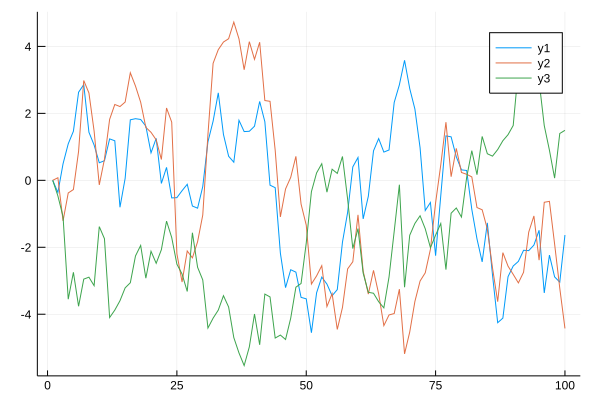

In [2]:
plot(y)

- Plotting a plot makes subplots
- `scatter(y)` is the same as adding `seriestype = :scatter`

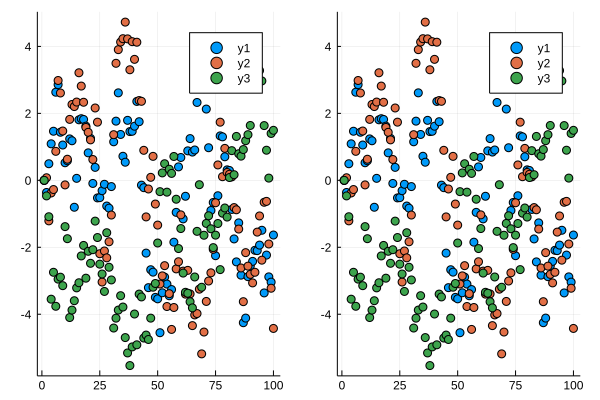

In [3]:
plot(
    plot(y, seriestype = :scatter),
    scatter(y)
)

# "Magic" Arguments

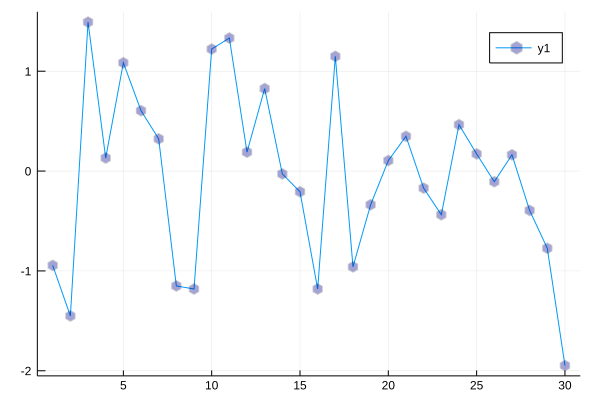

In [30]:
plot(randn(30), marker = (5, .2, :blue, :hex))

# Plot Recipes

- Suppose you want to write a custom plot for a type you've created.  You can write a "recipe" with [RecipesBase.jl](https://github.com/JuliaPlots/RecipesBase.jl)
- An example:

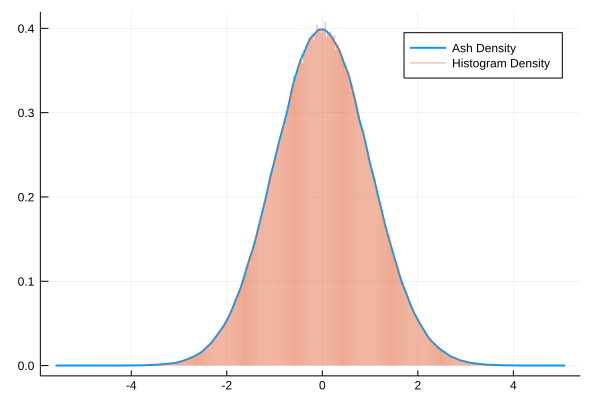

In [4]:
using AverageShiftedHistograms

plot(ash(randn(10^6)))

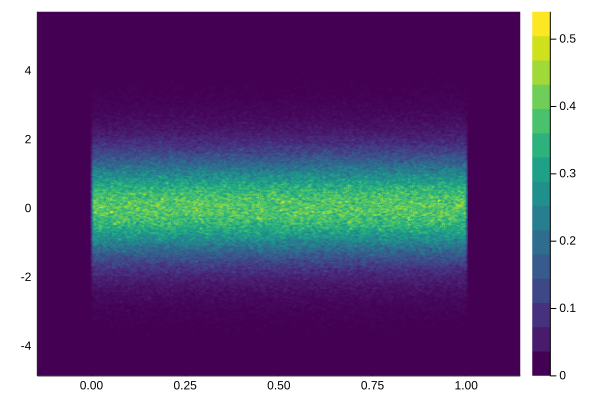

In [11]:
a = ash(rand(10^6), randn(10^6); mx=2, my=2)

plot(a, fill=true, color=:viridis)

# Plot Recipe Example

In [6]:
using RecipesBase

struct Thing
    x
    y
end

In [7]:
@recipe function f(o::Thing)
    title --> "Thing"
    color --> :blues
    label --> "These are Numbers"
    o.x, o.y
end

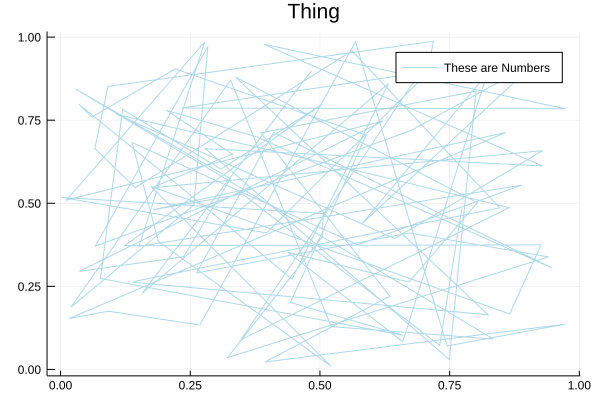

In [20]:
o = Thing(rand(100), rand(100))
p = plot(o)

## Plots are Mutable

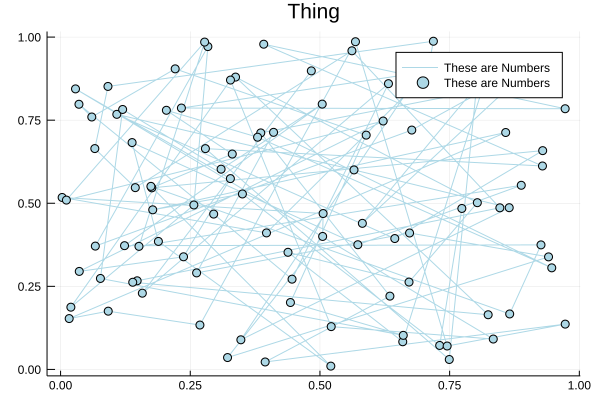

In [21]:
scatter!(o)

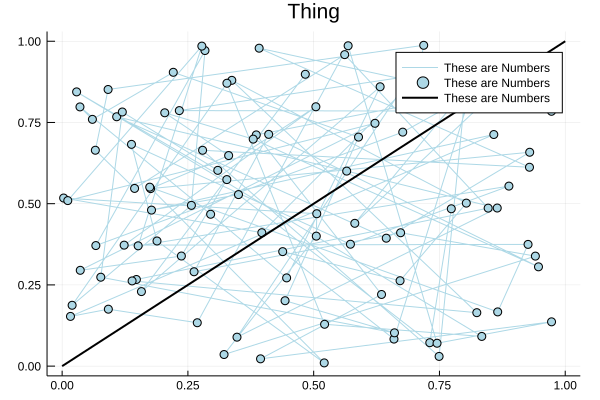

In [22]:
rng = range(0, stop=1, length=100)
o2 = Thing(rng, rng)
plot!(o2, line = (2, :black))

### Plot recipes are great for simulation results

```julia
struct SimulationResults 
    ...
end

@recipe function f(sr::SimulationResults)
    ...
end
```

![](linreg.pdf)